# AI for Assessment in Higher Education

The development of applications for assessment of student learning is an area undergoing fast change in the world of artificial inteligence in higher education. This repository was produced to provide practical examples to suport a book chapter ...

In this repository, you will find notebooks and Python scripts to support key ideas underpinning the development of AI applications for learning assessment. 

Rather than proposing a general and complete application, my goal is to provide a collection of modular examples that may fit a diverse set of cases, and, to some extent, illustrate the technology involved in using AI as a tool for summative and formative assessment.

The data used in this repository is part of the [Uppsala Student English Corpus](https://ota.bodleian.ox.ac.uk/repository/xmlui/handle/20.500.12024/2457) (University of Oxford 2003), which is publicly available and licenced under: [Attribution-NonCommercial-ShareAlike 3.0 Unported (CC BY-NC-SA 3.0)](http://creativecommons.org/licenses/by-nc-sa/3.0/).

The Uppsala Student English corpus (USE) includes essays from the Department of English, Uppsala University, spanning the years 1999–2001. It was produced to support research on foreign language learning and teaching, as an evidence of written English of Swedish university students.

You will also find a [file](https://github.com/brodriguezmilla/foir/blob/master/foir_all_figures.png) that includes all the images produced in this notebook.



## Overview of the Notebook 

This notebook encompasses a wide range of materials, split into different sections. You should be able to move directly to the section of your interest, as long as you have the files and data required for that specific section. I will, therefore, try to summarize here what you will find ahead in all sections.

- Prepare the data 
    * We start by looking at the original files, directly downloaded for the USE corpus, as I merge them, and clean them when appropriate.
    * The USE corpus includes 1,489 essays in plain text format, organised in 14 essay type categories (each contained in one folder marked a1, a2, etc.).
    * The total number of words is 1,221,265, with an average essay length of 820 words.
    * In this section, I will merge all the 1,489 text files into a single dataset (csv format), keeping only the text column variable.   

## Step 1: Prepare the data
Importing, merging and cleaning

In [1]:
import warnings
warnings.filterwarnings('ignore')

First, let's import few must have libraries for such task:

* pandas - to be able to work on dataframes
* matplot and seaborn - to make plots
* numpy - for scientific computing

In [2]:
import os
import re
import pandas as pd
import numpy as np

In [3]:
docs = []
students = []
fnames = []
essay_types = []

for root, dirs, files in os.walk('../data/'):
    
    for file in files:

        fname = root+'/'+file
        f = open(fname, 'r')
        
        try:
            lines = f.readlines()

            tag = fname.split('/')[3]
            student = tag.split('.')[0]
            essay_type = tag.split('.')[1] 
            
            fnames.append(tag)
            students.append(student)
            essay_types.append(essay_type)
            
            temp = []
            for line in lines:
                if not line.startswith('<'):
                    if len(line) > 1:
                        temp.append(line.strip())
            f.close()

            essay = ''
            for t in temp:
                essay = essay+t

            docs.append(essay.strip())
        except:
            continue

In [4]:
# merging all docs into a single dataframe
data = pd.DataFrame.from_dict({
                                'file': fnames,
                                'student':students,
                                'type': essay_types,
                                'essay': docs,

                               })


In [5]:
data.shape

(1264, 4)

In [7]:
data

,file,student,type,essay
0,0130.a4.txt,0130,a4,Billy Bibbit is not one of the central charact...
1,3001.a4.txt,3001,a4,"I am, in this essay, going to discus the chara..."
2,3062.a4.txt,3062,a4,This is the story of Jeanette Winterson in for...
3,0122.a4.txt,0122,a4,This is an essay that deals with the main char...
4,1090.a4.txt,1090,a4,In Remembering Babylon by David Malouf there a...
...,...,...,...,...
1259,0113.a1.txt,0113,a1,I can still remember the fascination I felt wh...
1260,4045.a1.txt,4045,a1,There has been a great interest in the knowled...
1261,3041.a1.txt,3041,a1,IntroductionEnglish is the language that every...
1262,0101.a1.txt,0101,a1,"Ever since I first started studying English, a..."


### Text cleaning

In [8]:
data.dropna(subset=['essay'],inplace=True)
data['cleaned'] = data['essay'].map(lambda x: str(x))
data['cleaned'] = data['cleaned'].apply(lambda x: x.replace("\n", " "))
data['cleaned'] = data.apply(lambda row: re.sub(r"http\S+", "", row['cleaned']).lower(), 1)
data['cleaned'] = data.apply(lambda row: " ".join(filter(lambda x:x[0]!="@", row['cleaned'].split())), 1)

data.head()

,file,student,type,essay,cleaned
0,0130.a4.txt,0130,a4,Billy Bibbit is not one of the central charact...,billy bibbit is not one of the central charact...
1,3001.a4.txt,3001,a4,"I am, in this essay, going to discus the chara...","i am, in this essay, going to discus the chara..."
2,3062.a4.txt,3062,a4,This is the story of Jeanette Winterson in for...,this is the story of jeanette winterson in for...
3,0122.a4.txt,0122,a4,This is an essay that deals with the main char...,this is an essay that deals with the main char...
4,1090.a4.txt,1090,a4,In Remembering Babylon by David Malouf there a...,in remembering babylon by david malouf there a...


In [9]:
data

,file,student,type,essay,cleaned
0,0130.a4.txt,0130,a4,Billy Bibbit is not one of the central charact...,billy bibbit is not one of the central charact...
1,3001.a4.txt,3001,a4,"I am, in this essay, going to discus the chara...","i am, in this essay, going to discus the chara..."
2,3062.a4.txt,3062,a4,This is the story of Jeanette Winterson in for...,this is the story of jeanette winterson in for...
3,0122.a4.txt,0122,a4,This is an essay that deals with the main char...,this is an essay that deals with the main char...
4,1090.a4.txt,1090,a4,In Remembering Babylon by David Malouf there a...,in remembering babylon by david malouf there a...
...,...,...,...,...,...
1259,0113.a1.txt,0113,a1,I can still remember the fascination I felt wh...,i can still remember the fascination i felt wh...
1260,4045.a1.txt,4045,a1,There has been a great interest in the knowled...,there has been a great interest in the knowled...
1261,3041.a1.txt,3041,a1,IntroductionEnglish is the language that every...,introductionenglish is the language that every...
1262,0101.a1.txt,0101,a1,"Ever since I first started studying English, a...","ever since i first started studying english, a..."


### Basic word stats
Create new columns with basic text counts

In [10]:
# Character counts
data["char_count"] = data['cleaned'].map(lambda x: len(x))
# Word counts
data["word_count"] = data['cleaned'].map(lambda x: len(x.split()))
# String counts
data["avg_word_len"] = data['cleaned'].map(lambda x: np.mean([len(w) for w in str(x).split()]))

In [11]:
data.head()

,file,student,type,essay,cleaned,char_count,word_count,avg_word_len
0,0130.a4.txt,0130,a4,Billy Bibbit is not one of the central charact...,billy bibbit is not one of the central charact...,4925,873,4.642612
1,3001.a4.txt,3001,a4,"I am, in this essay, going to discus the chara...","i am, in this essay, going to discus the chara...",4853,905,4.363536
2,3062.a4.txt,3062,a4,This is the story of Jeanette Winterson in for...,this is the story of jeanette winterson in for...,5684,972,4.848765
3,0122.a4.txt,0122,a4,This is an essay that deals with the main char...,this is an essay that deals with the main char...,6405,1164,4.503436
4,1090.a4.txt,1090,a4,In Remembering Babylon by David Malouf there a...,in remembering babylon by david malouf there a...,5436,966,4.628364


#### Save cleaned essays

In [12]:
data.to_csv('../output/essays_clean.csv', index=False)

## Step 2: Text analytics


In [13]:
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [14]:
import re
from collections import Counter

In [15]:
import time
from time import sleep, time
from timeit import default_timer as timer

In [16]:
import spacy
nlp = spacy.load("en_core_web_sm")

#### Load cleaned essays dataset

In [17]:
data = pd.read_csv('../output/essays_clean.csv')

In [18]:
data.head()

,file,student,type,essay,cleaned,char_count,word_count,avg_word_len
0,0130.a4.txt,130,a4,Billy Bibbit is not one of the central charact...,billy bibbit is not one of the central charact...,4925,873,4.642612
1,3001.a4.txt,3001,a4,"I am, in this essay, going to discus the chara...","i am, in this essay, going to discus the chara...",4853,905,4.363536
2,3062.a4.txt,3062,a4,This is the story of Jeanette Winterson in for...,this is the story of jeanette winterson in for...,5684,972,4.848765
3,0122.a4.txt,122,a4,This is an essay that deals with the main char...,this is an essay that deals with the main char...,6405,1164,4.503436
4,1090.a4.txt,1090,a4,In Remembering Babylon by David Malouf there a...,in remembering babylon by david malouf there a...,5436,966,4.628364


### Text pre-processing
Add a new column with pre-processed text 

In [19]:
# Convert text to lowercase, remove punctuation and trailing spaces
data['processed'] = data['cleaned'].map(lambda x: x.lower().replace('[^\w\s]', ' ').replace(' +', ' ').strip())

In [20]:
# Remove non-Latin characters
data['processed'] = data['processed'].map(lambda x: re.sub("([^\x00-\x7F])+", " ", x))

In [21]:
# Remove line breaks
data['processed'] = data['processed'].map(lambda x: x.replace("\n", " "))

In [22]:
# Remove all non-ASCII chars
data["processed"] = data['processed'].map(lambda x: re.sub('[^A-z0-9 -]', '', x).replace(" ", " "))

In [23]:
# Remove stopwords
data["processed"] = data['processed'].map(lambda x: ' '.join([w for w in x.split() if not nlp.vocab[w].is_stop])   )

In [24]:
# Remove some of the punctuation but keep ,.!? and -
remove = '"#$%&()*+/:;<=>@[\\]^_`{|}~”“-'
_string = r"[{}]".format(remove)
data["processed"] = data['processed'].apply(lambda txt : re.sub(_string,' ', txt) )

In [25]:
# Remove single letter words
data["processed"] = data['processed'].map(lambda x: ' '.join([w for w in x.split() if len(x)> 2] ))

#### Get most common words

In [83]:
# Merging all text into a list
all_text = " ".join(w for w in data['cleaned'].astype(str))
#split it into a list of words
all_words = text_all.split()

In [84]:
len(all_words)

422568

In [26]:
# Merging all text into a list
text_all = " ".join(w for w in data['processed'].astype(str))
#split it into a list of words
tokens = text_all.split()

In [27]:
# Get list of fity most frequent words
most_common = Counter(tokens).most_common(100)

### NLP feature engineering
Add new columns with linguistic features (POS, etc)

In [28]:
# Add POS info to dataset
start = time()
data['verbs'] = data['processed'].map(lambda x: ' '.join([w.text for w in nlp(x) if w.pos_ == "VERB"]))
data['nouns'] = data['processed'].map(lambda x: ' '.join([w.text for w in nlp(x) if w.pos_ == "NOUN"]))
data['adjs'] = data['processed'].map(lambda x: ' '.join([w.text for w in nlp(x) if w.pos_ == "ADJ"]))
print(f'Total Execution Time: %.2f' % (time()-start))

Total Execution Time: 143.95


In [36]:
data

,file,student,type,essay,cleaned,char_count,word_count,avg_word_len,processed,verbs,nouns,adjs
0,0130.a4.txt,130,a4,Billy Bibbit is not one of the central charact...,billy bibbit is not one of the central charact...,4925,873,4.642612,billy bibbit central characters keseys flew cu...,bibbit flew changed dies look mentioned claims...,characters keseys nest way story revolve chara...,central important desperate closer prominent b...
1,3001.a4.txt,3001,a4,"I am, in this essay, going to discus the chara...","i am, in this essay, going to discus the chara...",4853,905,4.363536,essay going discus character characterisation ...,going mamas gave read know supposed called unf...,essay discus character characterisation ellen ...,nastiest civilised prone rich fullest short ri...
2,3062.a4.txt,3062,a4,This is the story of Jeanette Winterson in for...,this is the story of jeanette winterson in for...,5684,972,4.848765,story jeanette winterson form semi autobiograp...,form written struggling come adopted raised kn...,story novel stories class girl terms sexuality...,semi autobiographical middle evangelical unque...
3,0122.a4.txt,122,a4,This is an essay that deals with the main char...,this is an essay that deals with the main char...,6405,1164,4.503436,essay deals main character book flew cuckoos n...,deals flew given followed created stands commi...,essay character book description explanation n...,main thorough complex novel specific significa...
4,1090.a4.txt,1090,a4,In Remembering Babylon by David Malouf there a...,in remembering babylon by david malouf there a...,5436,966,4.628364,remembering babylon david malouf characters in...,remembering described shifting described shift...,characters perspective person character views ...,different ellen perceive different complex min...
...,...,...,...,...,...,...,...,...,...,...,...,...
1259,0113.a1.txt,113,a1,I can still remember the fascination I felt wh...,i can still remember the fascination i felt wh...,6303,1179,4.346904,remember fascination felt age years confronted...,remember felt confronted glow sounds knew talk...,fascination age years school kind language wor...,new subject english mysterious different new n...
1260,4045.a1.txt,4045,a1,There has been a great interest in the knowled...,there has been a great interest in the knowled...,2346,427,4.496487,great interest knowledge english late neat lit...,intend reveal weaknessesmy understanding under...,interest knowledge presentation world capabili...,great neat little literary english main englis...
1261,3041.a1.txt,3041,a1,IntroductionEnglish is the language that every...,introductionenglish is the language that every...,1423,286,3.979021,introductionenglish language everybody knows w...,knows meet learned speaking think learn know s...,language world people world use travel peoplei...,introductionenglish good new english old engli...
1262,0101.a1.txt,101,a1,"Ever since I first started studying English, a...","ever since i first started studying english, a...",3681,682,4.398827,started studying english age felt special fond...,started studying felt learn found given speaki...,age fondness learn language schoolyears school...,english special natural logical second possibl...


In [32]:
data.to_csv('../output/essays_nlp.csv', index=False)

### Plotting

In [33]:
data.head()

,file,student,type,essay,cleaned,char_count,word_count,avg_word_len,processed,verbs,nouns,adjs
0,0130.a4.txt,130,a4,Billy Bibbit is not one of the central charact...,billy bibbit is not one of the central charact...,4925,873,4.642612,billy bibbit central characters keseys flew cu...,bibbit flew changed dies look mentioned claims...,characters keseys nest way story revolve chara...,central important desperate closer prominent b...
1,3001.a4.txt,3001,a4,"I am, in this essay, going to discus the chara...","i am, in this essay, going to discus the chara...",4853,905,4.363536,essay going discus character characterisation ...,going mamas gave read know supposed called unf...,essay discus character characterisation ellen ...,nastiest civilised prone rich fullest short ri...
2,3062.a4.txt,3062,a4,This is the story of Jeanette Winterson in for...,this is the story of jeanette winterson in for...,5684,972,4.848765,story jeanette winterson form semi autobiograp...,form written struggling come adopted raised kn...,story novel stories class girl terms sexuality...,semi autobiographical middle evangelical unque...
3,0122.a4.txt,122,a4,This is an essay that deals with the main char...,this is an essay that deals with the main char...,6405,1164,4.503436,essay deals main character book flew cuckoos n...,deals flew given followed created stands commi...,essay character book description explanation n...,main thorough complex novel specific significa...
4,1090.a4.txt,1090,a4,In Remembering Babylon by David Malouf there a...,in remembering babylon by david malouf there a...,5436,966,4.628364,remembering babylon david malouf characters in...,remembering described shifting described shift...,characters perspective person character views ...,different ellen perceive different complex min...


In [37]:
# Build wordcloud
def draw_wordcloud(col, title):
    merged_text = ' '.join(col.split())

    wordcloud = WordCloud(max_words=50, colormap='Dark2',background_color='white').generate(merged_text)
    plt.figure(figsize=(10,5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.figure(1,figsize=(12, 12))
    plt.title(title+'\n',fontsize=19)
    plt.show()
    plt.savefig('../images/'+'wordcloud_'+title+'.png',dpi = 75)

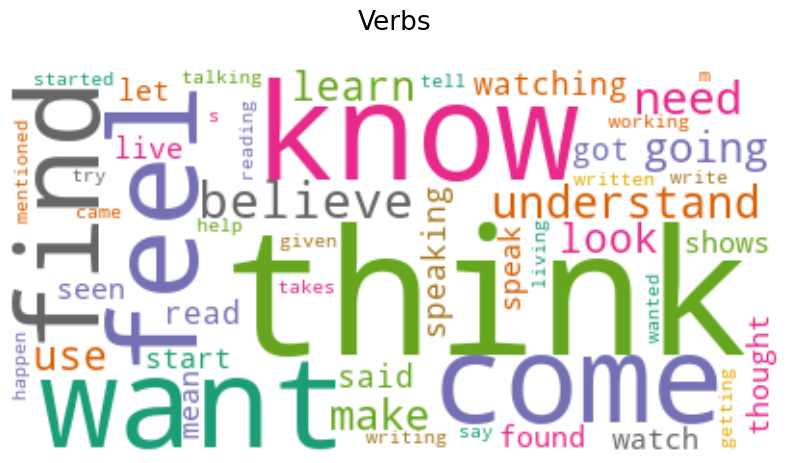

<Figure size 640x480 with 0 Axes>

In [38]:
# Example with the verbs column
verbs = " ".join(w for w in data['verbs'].astype(str))
draw_wordcloud(verbs, 'Verbs')

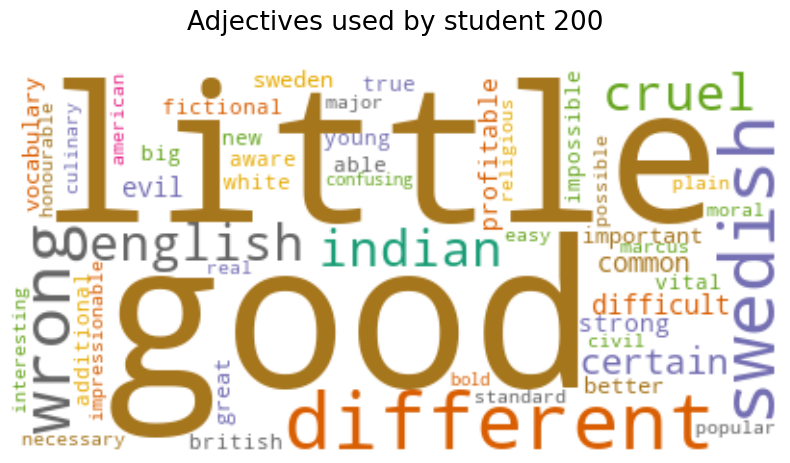

<Figure size 640x480 with 0 Axes>

In [39]:
# Example of adjectives in all essays of a specific student
df = data[data['student'] == 200]
adjectives = " ".join(w for w in df['adjs'].astype(str))
draw_wordcloud(adjectives, 'Adjectives used by student 200')

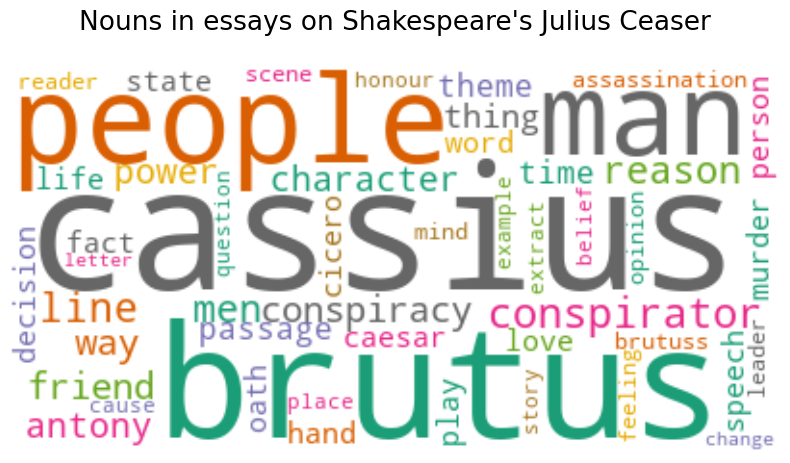

<Figure size 640x480 with 0 Axes>

In [40]:
# Example of nouns in all essays of a specific type
df = data[data['type'] == 'b4']
nouns = " ".join(w for w in df['nouns'].astype(str))
draw_wordcloud(nouns, "Nouns in essays on Shakespeare's Julius Ceaser")

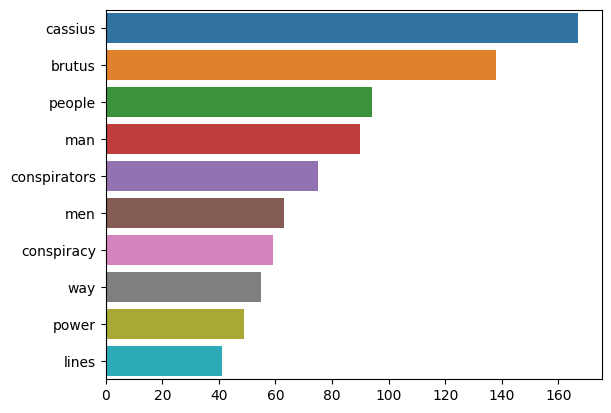

In [56]:
df = data[data['type'] == 'b4']

words = " ".join(w for w in df['nouns'].astype(str))

most_common_words = Counter(words.split()).most_common(10)

# Plot most common
ws, frequency = [], []
for word, count in most_common_words:
    ws.append(word)
    frequency.append(count)
    
ax = sns.barplot(x = frequency, y = ws)
plt.savefig('../images/word frequency.png',dpi = 75)
plt.show()

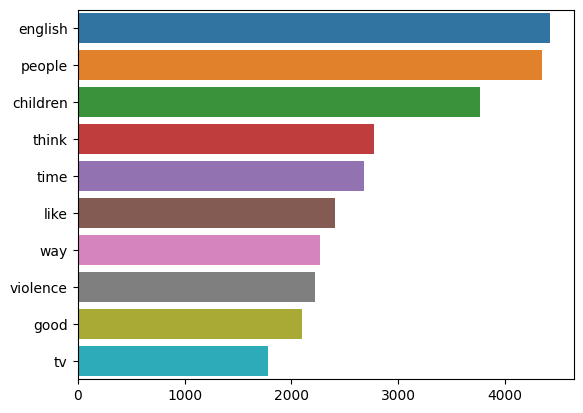

In [50]:
# Get most common words
words = " ".join(w for w in data['processed'].astype(str))

most_common_words = Counter(words.split()).most_common(10)

# Plot most common
ws, frequency = [], []
for word, count in most_common_words:
    ws.append(word)
    frequency.append(count)
    
ax = sns.barplot(x = frequency, y = ws)
plt.savefig('../images/word frequency.png',dpi = 75)
plt.show()

In [53]:
# Creating a dictionary to hold the counts for essays of student 200

#data_sel = pd.read_csv('../output/essays_nlp.csv')
data_sel = data[data['student'] == 200]
content_count = {
    'n_verbs' : data_sel['verbs'].map(lambda x: len(x.split())),
    'n_adjectives' : data_sel['adjs'].map(lambda x: len(x.split())),
    'n_nouns' : data_sel['nouns'].map(lambda x: len(x.split())),   
}
df = pd.concat([data_sel, pd.DataFrame(content_count)], axis=1)


In [55]:
# Display descriptive statistics fdor words, mentions,
# hashtags and urls
for key in content_count.keys():
    print()
    print('Statistics for {}'.format(key) + ' in essays by student 200')
    print(df.groupby('type')[key].describe())


Statistics for n_verbs in essays by student 200
      count   mean  std    min    25%    50%    75%    max
type                                                      
a1      1.0  104.0  NaN  104.0  104.0  104.0  104.0  104.0
a2      1.0   72.0  NaN   72.0   72.0   72.0   72.0   72.0
a3      1.0   58.0  NaN   58.0   58.0   58.0   58.0   58.0
a4      1.0   88.0  NaN   88.0   88.0   88.0   88.0   88.0
a5      1.0  121.0  NaN  121.0  121.0  121.0  121.0  121.0
b1      1.0   74.0  NaN   74.0   74.0   74.0   74.0   74.0
b2      1.0   82.0  NaN   82.0   82.0   82.0   82.0   82.0
b3      1.0   95.0  NaN   95.0   95.0   95.0   95.0   95.0
b4      1.0  106.0  NaN  106.0  106.0  106.0  106.0  106.0
b5      1.0  134.0  NaN  134.0  134.0  134.0  134.0  134.0
c1      1.0  156.0  NaN  156.0  156.0  156.0  156.0  156.0

Statistics for n_adjectives in essays by student 200
      count   mean  std    min    25%    50%    75%    max
type                                                      
a1      1.0 

## Step 2: Topic modelling
### Automated content analysis

In [57]:
from bertopic import BERTopic
from keybert import KeyBERT
from bertopic.representation import KeyBERTInspired
#from keyphrase_vectorizers import KeyphraseCountVectorizer
from sklearn.feature_extraction.text import CountVectorizer

In [58]:
data = pd.read_csv('../output/essays_nlp.csv')

In [59]:
text = data['cleaned'].to_list()

In [60]:
len(text)

1264

In [61]:
from sentence_transformers import SentenceTransformer

# Create embeddings
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')


In [ ]:
embeddings = model.encode(text)

In [ ]:
import numpy as np
with open('../models/essays_embeddings.npy', 'wb') as f:
    np.save(f, embeddings)

In [62]:
embeddings = np.load('../models/essays_embeddings.npy')

In [63]:
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"

In [64]:
vectorizer_model = CountVectorizer(stop_words="english", ngram_range=(1, 2), min_df=5)

In [ ]:
topic_model = BERTopic(
            embedding_model=model,
            vectorizer_model=vectorizer_model,
            representation_model=KeyBERTInspired(),
            calculate_probabilities=False,
            language='english',
            verbose = True
).fit(text, embeddings=embeddings)

In [ ]:
topic_model.save('../models/essays_model')

In [65]:
topic_model = BERTopic.load('../models/essays_model')

In [66]:
topics = topic_model.fit_transform(text, embeddings)

In [67]:
data['topic'] = topics[0]

In [78]:
df=topic_model.get_topic_info()
df

,Topic,Count,Name,Representation,Representative_Docs
0,-1,71,-1_children_parents_dress_society,"[children, parents, dress, society, wear, chil...",[the society we live in today is obsessed with...
1,0,295,0_english_english language_language_reading,"[english, english language, language, reading,...",[this essay is about my strengths and weakness...
2,1,283,1_television_violence_tv_watching tv,"[television, violence, tv, watching tv, violen...",[violence on tv has become a huge problem for ...
3,2,83,2_happiness_family life_unhappiness_novel,"[happiness, family life, unhappiness, novel, s...","[i have chosen the novel ""the fifth child"" by ..."
4,3,39,3_swedish schools_teachers_swedish_sweden,"[swedish schools, teachers, swedish, sweden, t...",[the swedish school is in desperate need of a ...
5,4,37,4_meat_cattle_eating_eat,"[meat, cattle, eating, eat, diet, animals, foo...",[some people say that meat is murder. is it? w...
6,5,35,5_nineteenth century_women children_19th centu...,"[nineteenth century, women children, 19th cent...",[in the nineteenth century it was generally ag...
7,6,33,6_daughters_novel_daughter_mrs,"[daughters, novel, daughter, mrs, woman, women...",[little women can be said to represent one of ...
8,7,29,7_narrator_passage_reader_readers,"[narrator, passage, reader, readers, passages,...",[i have read the novel remembering babylon by ...
9,8,29,8_unemployment_unemployed_employment_people work,"[unemployment, unemployed, employment, people ...",[many people might think that forcing unemploy...


In [76]:
topic_model.get_topic(0)

[('english', 0.39453918),
 ('english language', 0.39434093),
 ('language', 0.3438453),
 ('reading', 0.34093237),
 ('writing', 0.33092594),
 ('languages', 0.3207502),
 ('speak', 0.31880578),
 ('vocabulary', 0.3012832),
 ('studying', 0.2986369),
 ('learn', 0.29291987)]

In [ ]:
df.to_csv('../output/essays_topics_info.csv', index=False)

In [ ]:
data.to_csv('../output/essays_topics.csv', index=False)

In [69]:
df_topic_freq = topic_model.get_topic_freq()
topics_count = len(df_topic_freq) - 1


In [70]:
topic_model.visualize_barchart(top_n_topics=12)


In [71]:
topic_model.visualize_hierarchy()

In [72]:
from umap import UMAP
reduced_embeddings = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings)
topic_model.visualize_documents(docs, reduced_embeddings=reduced_embeddings)

In [ ]:
import matplotlib.pyplot as plt

# Prepare data
umap_data = umap.UMAP(n_neighbors=15, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings)
result = pd.DataFrame(umap_data, columns=['x', 'y'])
result['labels'] = cluster.labels_

# Visualize clusters
fig, ax = plt.subplots(figsize=(20, 10))
outliers = result.loc[result.labels == -1, :]
clustered = result.loc[result.labels != -1, :]
plt.scatter(outliers.x, outliers.y, color='#BDBDBD', s=0.05)
plt.scatter(clustered.x, clustered.y, c=clustered.labels, s=0.05, cmap='hsv_r')
plt.colorbar()

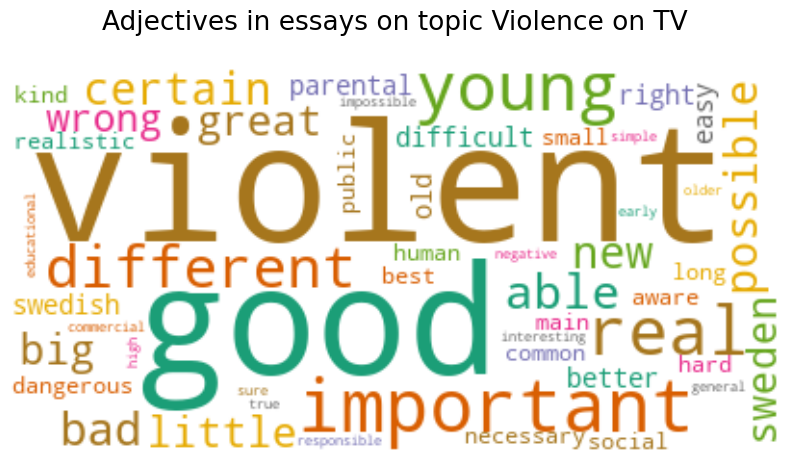

<Figure size 640x480 with 0 Axes>

In [73]:
# Example of nouns in all essays of a specific type
df = data[data['topic'] == 1]
adjectives = " ".join(w for w in df['adjs'].astype(str))
draw_wordcloud(adjectives, "Adjectives in essays on topic Violence on TV")

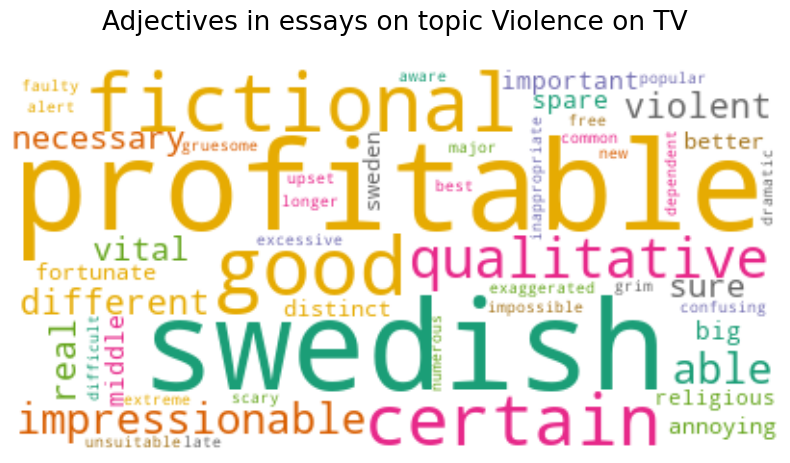

<Figure size 640x480 with 0 Axes>

In [79]:
# Example of nouns in all essays of a specific type
df = data[(data['topic'] == 1) & (data['student'] == 200)]
adjectives = " ".join(w for w in df['adjs'].astype(str))
draw_wordcloud(adjectives, "Adjectives in essays on topic Violence on TV")

<Axes: >

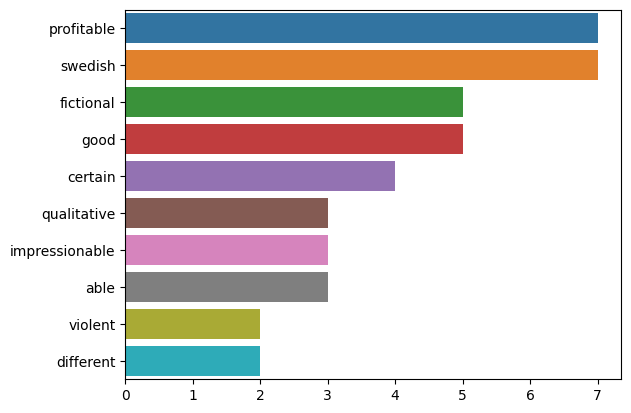

In [74]:
# Get most common adjectives on topic TV violence by student 200

df = data[(data['topic'] == 1) & (data['student'] == 200)]
adjectives = " ".join(w for w in df['adjs'].astype(str))

most_common_adjectives = Counter(adjectives.split()).most_common(10)

# Plot most common
words, frequency = [], []
for word, count in most_common_adjectives:
    words.append(word)
    frequency.append(count)
    
sns.barplot(x = frequency, y = words)

## Step 3: Keywords
Extracting keywords from a document

In [ ]:
from keybert import KeyBERT
from keyphrase_vectorizers import KeyphraseCountVectorizer


In [ ]:
data = pd.read_csv('../output/essays_clean.csv')

In [ ]:
doc = data[data['file'] == '0107.b7.txt']

In [ ]:
sentences = []
sentences.append(doc['cleaned'].values[0][:509])
sentences.append(doc['cleaned'].values[0][510:1244])

In [ ]:
sentences[0]

In [ ]:
sentences[1]

In [ ]:
# Init KeyBERT
kw_model = KeyBERT()

In [ ]:
from keyphrase_vectorizers import KeyphraseCountVectorizer

kw_model.extract_keywords(docs=sentences, vectorizer=KeyphraseCountVectorizer())